<a href="https://colab.research.google.com/github/ufbfung/cardiac-3d-reconstruction/blob/main/dataset_exploration_echonet.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Setup**
In this section, we mount the google drive that contains all of the data downloaded from EchoNet: video clips of psax and a4c, file listings, and labels in the form of expert tracings.

Next, we setup some helpful file paths to access the location of the various files downloaded.

Lastly, we install EchoNet from https://github.com/bryanhe/dynamic by following the instructions in the Readme.md to clone the repository. To complete the setup of EchoNet, the downloaded repository was also loaded into google drive and subsequently imported into Colab for use.

In [ ]:
# Mount drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Import relevant libraries and dependencies
import os
import pandas as pd

## Install EchoNet

In this setup, we installed EchoNet by doing the followingg:
1. Clone repository per instructions on [EchoNet](https://github.com/bryanhe/dynamic)
2. Move all downloaded files and folders into Google Drive
3. Change directory to root where setup.py is located (i.e. dynamic)
4. Import echonet to complete setup



In [ ]:
# After completing steps 1 and 2 above, proceed with following

# Define path to directory where setup.py is located
echonet_path = '/content/drive/My Drive/Stanford/biomedin260/final_project/dynamic'

# Change working directory to path
%cd {echonet_path}

# Import relevant library
import echonet

/content/drive/My Drive/Stanford/biomedin260/final_project/dynamic


In [ ]:
# File paths
root_path = '/content/drive/My Drive/Stanford/biomedin260/data/echonetpediatric/pediatric_echo_avi/pediatric_echo_avi'

a4c_path = os.path.join(root_path, 'A4C')
a4c_videos_path = os.path.join(a4c_path, 'Videos')
a4c_filelist_path = os.path.join(a4c_path, 'FileList.csv')
a4c_volumetracings_path = os.path.join(a4c_path, 'VolumeTracings.csv')

psax_path = os.path.join(root_path, 'PSAX')
psax_videos_path = os.path.join(psax_path, 'Videos')
psax_filelist_path = os.path.join(psax_path, 'FileList.csv')
psax_volumetracings_path = os.path.join(psax_path, 'VolumeTracings.csv')

In [ ]:
# Echocardiogram videos
# Per https://echonet.github.io/pediatric/
# there should be 3,176 apical-4-chamber echocardiography videos and
# 4,424 parasternal short axis echocardiography videos from individuals
# who underwent imaging between 2014 - 2021 as part of routine clinical care at Lucile Packard Children's Hospital at Stanford

# Downloaded videos appear to contain more
len_a4c_videos = len(os.listdir(psax_videos_path))
len_psax_videos = len(os.listdir(a4c_videos_path))

print("count of a4c videos:", len_a4c_videos)
print("count of psax videos:", len_psax_videos)

count of a4c videos: 4526
count of psax videos: 3284


# **Measurements**
For a refresher on cardiac functions, namely ejection fraction calculations, see this video: https://www.youtube.com/watch?v=vFRkSB46bl8

The dataset uses the "Bullet method" or the "5/6 area length method" to measure the EF
EF = (EDV-ESV)/EDV


In [ ]:
# FileListings
psax_filelist = pd.read_csv(psax_filelist_path)
a4c_filelist = pd.read_csv(a4c_filelist_path)

# Print listings
print("PSAX file list")
psax_filelist.head()
print("A4C file list")
a4c_filelist.head()

PSAX file list
A4C file list


,FileName,EF,Sex,Age,Weight,Height,Split
0,CR32a7555-CR32a7582-000039.avi,40.83,F,0,10.2,68.5,5
1,CR32a7555-CR32a97af-000033.avi,52.62,F,1,15.5,85.0,5
2,CR32a7555-CR32a97e1-000024.avi,24.85,F,0,4.0,56.0,5
3,CR32a7555-CR32a9850-000040.avi,50.96,F,4,18.0,99.0,5
4,CR32a7555-CR32a988d-000034.avi,56.76,F,0,13.2,75.0,5


# **Labels**
#### Directly from [EchoNet](https://echonet.github.io/pediatric/):

In our dataset, for each video, the left ventricle is traced at the endocardial border at two separate time points representing end-systole and end-diastole. Each tracing is used to estimate ventricular volume by integration of ventricular area over the length of the major axis of the ventricle. The expert tracings are represented by a collection of paired coordinates corresponding to each human tracing. The first pair of coordinates represent the length and direction of the long axis of the left ventricle, and subsequent coordinate pairs represent short axis linear distances starting from the apex of the heart to the mitral apparatus. Each coordinate pair is also listed with a video file name and frame number to identify the representative frame from which the tracings match.

In [ ]:
# Tracings
psax_tracings = pd.read_csv(psax_volumetracings_path)
a4c_tracings = pd.read_csv(a4c_volumetracings_path)

psax_tracings.head(10)

,FileName,X,Y,Frame
0,CR32a7555-CR32a7582-000027.avi,26.0,60.0,17
1,CR32a7555-CR32a7582-000027.avi,26.0,60.0,17
2,CR32a7555-CR32a7582-000027.avi,26.0,60.0,17
3,CR32a7555-CR32a7582-000027.avi,26.0,61.0,17
4,CR32a7555-CR32a7582-000027.avi,26.0,61.0,17
5,CR32a7555-CR32a7582-000027.avi,25.0,62.0,17
6,CR32a7555-CR32a7582-000027.avi,28.0,70.0,17
7,CR32a7555-CR32a7582-000027.avi,28.0,70.0,17
8,CR32a7555-CR32a7582-000027.avi,28.0,70.0,17
9,CR32a7555-CR32a7582-000027.avi,28.0,71.0,17


# **Explore EchoNet functions**
This section explores some of the functions available in the Echonet module.

In [ ]:
# General help
help(echonet)

Help on package echonet:

NAME
    echonet

DESCRIPTION
    The echonet package contains code for loading echocardiogram videos, and
    functions for training and testing segmentation and ejection fraction
    prediction models.

PACKAGE CONTENTS
    __main__
    __version__
    config
    datasets (package)
    utils (package)

DATA
    __all__ = ['__version__', 'config', 'datasets', 'main', 'utils']
    config = namespace(FILENAME=None, DATA_DIR='a4c-video-dir/')
    main = <Group main>
        Entry point for command line interface.

VERSION
    1.0.0

FILE
    /content/drive/My Drive/Stanford/biomedin260/final_project/dynamic/echonet/__init__.py




In [ ]:
# Explore utilities
help(echonet.utils)

Help on package echonet.utils in echonet:

NAME
    echonet.utils - Utility functions for videos, plotting and computing performance metrics.

PACKAGE CONTENTS
    joint
    segmentation
    video
    volume

FUNCTIONS
    bootstrap(a, b, func, samples=10000)
        Computes a bootstrapped confidence intervals for ``func(a, b)''.
        
        Args:
            a (array_like): first argument to `func`.
            b (array_like): second argument to `func`.
            func (callable): Function to compute confidence intervals for.
                ``dataset[i][0]'' is expected to be the i-th video in the dataset, which
                should be a ``torch.Tensor'' of dimensions (channels=3, frames, height, width)
            samples (int, optional): Number of samples to compute.
                Defaults to 10000.
        
        Returns:
           A tuple of (`func(a, b)`, estimated 5-th percentile, estimated 95-th percentile).
    
    dice_similarity_coefficient(inter, union)
    

# **Pre-Processing**
Experimenting with simple pre-processing of video clips using OpenCV library.

In [ ]:
# Load the videos to a list
list_of_a4c_videos = os.listdir(a4c_videos_path)
list_of_psax_videos = os.listdir(psax_videos_path)

# Load a single video
video = list_of_a4c_videos[2]

# Path to single video
video_path = os.path.join(a4c_videos_path, video)

# Check video loaded
video_path

'/content/drive/My Drive/Stanford/biomedin260/data/echonetpediatric/pediatric_echo_avi/pediatric_echo_avi/A4C/Videos/CR3dca6bb-CR3dca8a8-000059.avi'

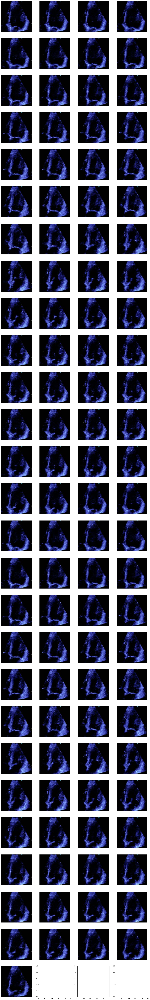

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load the video using OpenCV
capture = cv2.VideoCapture(video_path)

# Set up the plot
num_cols = 4  # Number of columns in the plot
num_rows = np.ceil(capture.get(cv2.CAP_PROP_FRAME_COUNT) / num_cols).astype(int)  # Number of rows in the plot
fig, ax = plt.subplots(num_rows, num_cols, figsize=(20, 5*num_rows))

# Loop over all frames in the video
for i in range(num_rows):
    for j in range(num_cols):
        ret, frame = capture.read()
        if not ret:
            break

        # Apply any pre-processing steps to the frame, such as resizing and normalization

        # Display the current frame
        ax[i, j].imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        ax[i, j].axis('off')

    if not ret:
        break

# Release the capture object and close all windows
capture.release()
plt.show()


# **Segmentation**
**PyTorch** is a popular open-source machine learning framework that is commonly used for developing and training deep neural networks. One of the fundamental data structures in PyTorch is a **tensor**, which is basically a multidimensional array that can store and manipulate numerical data. We will be using PyTorch to perform the segmentation.

The tensor function is used to convert the numpy array frame into a PyTorch tensor. This allows the tensor to be used with PyTorch's built-in functions and methods, as well as to be processed on a GPU if one is available.

Specifically, torch.from_numpy(frame) creates a new tensor by copying the data from the numpy array frame. The resulting tensor has the same data type and shape as the numpy array. For example, if frame is a numpy array of shape (H, W, C) (height, width, channels), then the resulting PyTorch tensor will have the shape (H, W, C) as well.

Once the PyTorch tensor is created, it can be passed through a deep neural network model for processing and analysis. In this way, PyTorch and tensors enable efficient and scalable computation for complex machine learning tasks.

In [ ]:
project_path = '/content/drive/My Drive/Stanford/biomedin260/final_project'

In [ ]:
import echonet
import numpy as np

# Initialize segmentation model
model = echonet.utils.segmentation

# Preprocess video frames
frames = []
for frame in video:
    frame = echonet.utils.video.resize(frame, size=model.input_size)
    frames.append(frame)
input_tensor = echonet.utils.video.stack(frames)

# Obtain segmentation mask
mask = model.predict(input_tensor)

# Segment video clip
segmented_video = video * mask

# Define output path
output_path = project_path

# Save segmented video clip
echonet.utils.savevideo(output_path, segmented_video)

AttributeError: ignored